# Doing Random Things with [MNIST Digits Dataset](https://en.wikipedia.org/wiki/MNIST_database)

NOTE: This is a rewrite of some scripts that I found on my hard drive from 4-5 years ago - mainly getting familiar with deep learning libraries and some fancy visualization stuff

## Loading the Data

Sadly, the dataset is [not available](http://yann.lecun.com/exdb/mnist/) from Yann Lecun's webpage - we will use the built-in loader from Keras instead:

In [ ]:
# Some usual imports
from keras.datasets import mnist
import keras
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

(digits_x_train, digits_y_train), (digits_x_test, digits_y_test) = mnist.load_data()
# Normalize data
digits_x_train = digits_x_train / 256.
digits_x_test = digits_x_test / 256.
digits_x_train = digits_x_train.reshape((-1, 784))
digits_x_test = digits_x_test.reshape((-1,784))

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


## Introductory Analysis

We first do some introductory analysis following the exposition given [here](http://varianceexplained.org/r/digit-eda/)

<Figure size 1000x100 with 0 Axes>

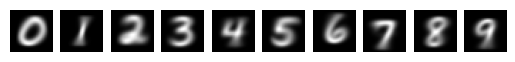

In [ ]:
# What does the average digit look like?
average_digits = [
    np.average( digits_x_train[ np.where( digits_y_train == d ) ] , axis=0 )
    for d in range(10)
]

plt.figure(figsize=(10, 1))
fig, ax = plt.subplots(1, 10)

for i in range(10):
    ax[i].axis("off")
    ax[i].imshow(average_digits[i].reshape((28, 28)), cmap='gray')

<Figure size 1000x1000 with 0 Axes>

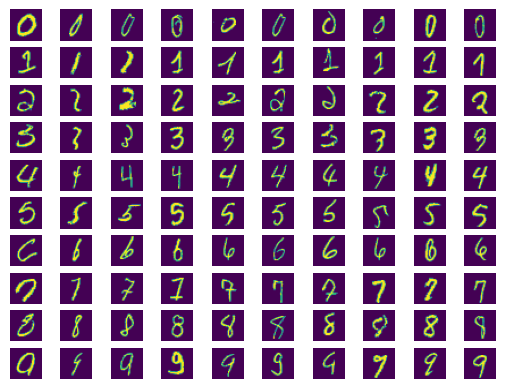

In [ ]:
# Finding atypical digits
plt.figure(figsize=(10, 10))
ax, fig = plt.subplots(10, 10)

for i in range(10):
    for j in range(10):
        fig[i][j].axis("off")
        # Plot a digit that is actually i but actually looks like j
        possible_digits = digits_x_train[digits_y_train == i ]
        actual_digit = average_digits[j]
        fig[i][j].imshow(
            possible_digits[
                np.argmin([ np.linalg.norm(d, 1 ) for d in  possible_digits - actual_digit ] )
            ].reshape( (28,28) )
        )

## Dumb Classifiers
We also include some dumb classifiers that get around 80% accuracy - this is the rate to beat for any future attempts.

In [8]:
# Display 1nn.mp4 in jupyter
from IPython.display import HTML
from base64 import b64encode
mp4 = open('1nn.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [22]:
mp4 = open('centroid.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)